In [17]:
import torchvision
from pathlib import Path
import matplotlib.pyplot as plt
import argparse
import os
import numpy as np
import math
import sys

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch
import torch.optim.lr_scheduler as lr_scheduler


from torch.utils.data import Dataset

from natsort import natsorted

from PIL import Image

import wandb

import datetime

# cuda is available
if torch.cuda.is_available():
    print('cuda is available')
    # get the number of GPUs
    print('number of GPUs:', torch.cuda.device_count())
    # get the name of the GPU
    print('name of the GPU:', torch.cuda.get_device_name(0))
    # get the current device
    print('current device:', torch.cuda.current_device())

    cuda = True

# precision setting, reccomended highest
torch.set_float32_matmul_precision("highest")

cuda is available
number of GPUs: 1
name of the GPU: NVIDIA GeForce RTX 3080
current device: 0


In [18]:
# Hyperparameters

n_epochs = 3000
batch_size = 32
lr = 1e-4
n_cpu = os.cpu_count()
latent_dim = 1024
img_size = 64
channels = 3
n_critic = 5
clip_value = 0.1
# Exponential LR scheduler every minibatch
gamma = 0.999995

img_shape = (channels, img_size, img_size)

In [19]:
# os.environ["WANDB_API_KEY"] = "47080269e7b1b5a51a89830cb24c495498237e77"
# wandb.init(
#     # set the wandb project where this run will be logged
#     project="GAN2",

#     # track hyperparameters and run metadata
#     config={
#     "learning_rate": f"{lr}",
#     "architecture": "GAN",
#     "dataset": "CATS",
#     "epochs": f"{n_epochs}",
#     "batch_size": f"{batch_size}",
#     "latent_dim": f"{latent_dim}",
#     "n_critic": f"{n_critic}",
#     "clip_value": f"{clip_value}",
#     "gamma (every minibatch)": f"{gamma}",
#     'name of the GPU:': f"{torch.cuda.get_device_name(0)}"
#     }
# )

In [20]:
# class Generator(torch.nn.Module):
#     def __init__(self):
#         super(Generator, self).__init__()

#         self.init_size = 64 // 4
#         self.latent_dim = 128

#         self.l1 = torch.nn.Sequential(torch.nn.Linear(self.latent_dim, 128 * self.init_size ** 2))

#         self.conv_blocks = torch.nn.Sequential(
#             torch.nn.BatchNorm2d(128),
#             torch.nn.Upsample(scale_factor=2),
#             torch.nn.Conv2d(128, 128, 3, stride=1, padding=1),
#             torch.nn.BatchNorm2d(128, 0.8),
#             torch.nn.LeakyReLU(0.2, inplace=True),
#             torch.nn.Upsample(scale_factor=2),
#             torch.nn.Conv2d(128, 64, 3, stride=1, padding=1),
#             torch.nn.BatchNorm2d(64, 0.8),
#             torch.nn.LeakyReLU(0.2, inplace=True),
#             torch.nn.Conv2d(64, 3, 3, stride=1, padding=1),
#             torch.nn.Tanh(),
#         )

#     def forward(self, z):
#         out = self.l1(z)
#         out = out.view(out.shape[0], 128, self.init_size, self.init_size)
#         img = self.conv_blocks(out)
#         return img

# class Discriminator(torch.nn.Module):
#     def __init__(self):
#         super(Discriminator, self).__init__()

#         def discriminator_block(in_filters, out_filters, bn=True):
#             block = [torch.nn.Conv2d(in_filters, out_filters, 3, 2, 1), 
#                     torch.nn.LeakyReLU(0.2, inplace=True), 
#                     torch.nn.Dropout2d(0.25)]
#             if bn:
#                 block.append(torch.nn.BatchNorm2d(out_filters, 0.8))
#             return block

#         self.model = torch.nn.Sequential(
#             *discriminator_block(3, 16, bn=False),
#             *discriminator_block(16, 32),
#             *discriminator_block(32, 64),
#             *discriminator_block(64, 128),
#         )

#         ds_size = 64 // 2 ** 4
#         self.adv_layer = torch.nn.Sequential(
#             torch.nn.Linear(128 * ds_size ** 2, 1), 
#             torch.nn.Sigmoid()
#         )

#     def forward(self, img):
#         out = self.model(img)
#         out = out.view(out.shape[0], -1)
#         validity = self.adv_layer(out)
#         return validity

In [21]:
# # Basic fully connected GAN
# class Generator(nn.Module):
#     def __init__(self):
#         super(Generator, self).__init__()

#         def block(in_feat, out_feat, normalize=True):
#             layers = [nn.Linear(in_feat, out_feat)]
#             if normalize:
#                 layers.append(nn.BatchNorm1d(out_feat, 0.8))
#             layers.append(nn.LeakyReLU(0.2, inplace=True))
#             return layers

#         self.model = nn.Sequential(
#             *block(latent_dim, 128, normalize=False),
#             *block(128, 256),
#             *block(256, 512),
#             *block(512, 1024),
#             nn.Linear(1024, int(np.prod(img_shape))),
#             nn.Tanh()
#         )


#     def forward(self, z):
#         img = self.model(z)
#         img = img.view(img.shape[0], *img_shape)
#         return img


# class Discriminator(nn.Module):
#     def __init__(self):
#         super(Discriminator, self).__init__()

#         self.model = nn.Sequential(
#             nn.Linear(int(np.prod(img_shape)), 512),
#             nn.LeakyReLU(0.2, inplace=True),
#             nn.Linear(512, 256),
#             nn.LeakyReLU(0.2, inplace=True),
#             nn.Linear(256, 1),
#             nn.Sigmoid()  # Add sigmoid activation for binary classification
#         )

#     def forward(self, img):
#         img_flat = img.view(img.shape[0], -1)
#         validity = self.model(img_flat)
#         return validity

In [22]:
# class Generator(nn.Module):
#     def __init__(self):
#         super(Generator, self).__init__()

#         def block(in_feat, out_feat, normalize=True):
#             layers = [nn.Linear(in_feat, out_feat)]
#             if normalize:
#                 layers.append(nn.BatchNorm1d(out_feat, 0.8))
#             layers.append(nn.LeakyReLU(0.2, inplace=True))
#             return layers

#         self.model = nn.Sequential(
#             *block(latent_dim, 128, normalize=False),
#             *block(128, 256),
#             *block(256, 512),
#             *block(512, 1024),
#             nn.Linear(1024, int(np.prod(img_shape))),
#             nn.Tanh()
#         )


#     def forward(self, z):
#         img = self.model(z)
#         img = img.view(img.shape[0], *img_shape)
#         return img


# class Discriminator(nn.Module):
#     def __init__(self):
#         super(Discriminator, self).__init__()

#         self.model = nn.Sequential(
#             nn.Linear(int(np.prod(img_shape)), 512),
#             nn.LeakyReLU(0.2, inplace=True),
#             nn.Linear(512, 256),
#             nn.LeakyReLU(0.2, inplace=True),
#             nn.Linear(256, 1),
#             nn.Sigmoid()
#         )

#     def forward(self, img):
#         img_flat = img.view(img.shape[0], -1)
#         validity = self.model(img_flat)
#         return validity

In [23]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        # Increased initial size remains same to maintain 64x64 output
        self.init_size = 64 // 4  # Starting with 16x16
        
        # Increased latent dimension for more expressive generation
        self.latent_dim = 1024
        
        # Increased number of features in initial linear layer
        self.l1 = nn.Sequential(
            nn.Linear(self.latent_dim, 256 * self.init_size ** 2),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Enhanced convolution blocks with more features and additional refinement layers
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(256),
            
            # First upsampling block (16x16 -> 32x32)
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            # Additional refinement layer
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Second upsampling block (32x32 -> 64x64)
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            # Additional refinement layer
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Final refinement and output layers
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 3, 3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 256, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, bn=True, kernel_size=3):
            block = [
                nn.Conv2d(in_filters, out_filters, kernel_size, 2, kernel_size//2),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Dropout2d(0.25)
            ]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block

        # Enhanced discriminator with more features and additional layers
        self.model = nn.Sequential(
            # Initial feature extraction (64x64 -> 32x32)
            *discriminator_block(3, 32, bn=False),
            nn.Conv2d(32, 32, 3, 1, 1),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Second block (32x32 -> 16x16)
            *discriminator_block(32, 64),
            nn.Conv2d(64, 64, 3, 1, 1),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Third block (16x16 -> 8x8)
            *discriminator_block(64, 128),
            nn.Conv2d(128, 128, 3, 1, 1),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Fourth block (8x8 -> 4x4)
            *discriminator_block(128, 256),
            nn.Conv2d(256, 256, 3, 1, 1),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # The height and width of downsampled image
        ds_size = 64 // 2 ** 4  # Still 4x4 as before
        
        # Enhanced final classification layers
        self.adv_layer = nn.Sequential(
            nn.Linear(256 * ds_size ** 2, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity

In [24]:
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        self.images = [f for f in os.listdir(img_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image

In [25]:
# Simple transormations for the images

transform = transforms.Compose([
    transforms.Resize(img_size),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = CustomImageDataset(img_dir="cats/Data", transform=transform)
dataloader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=n_cpu,
)

In [26]:
def save_checkpoint(generator, discriminator, optimizer_G, optimizer_D, epoch, loss_G, loss_D, save_dir):
    # Create checkpoint directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    checkpoint = {
        'epoch': epoch,
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizer_G_state_dict': optimizer_G.state_dict(),
        'optimizer_D_state_dict': optimizer_D.state_dict(),
        'loss_G': loss_G,
        'loss_D': loss_D
    }
    
    # Save with timestamp and epoch number
    timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    path = os.path.join(save_dir, f'checkpoint_epoch_{epoch}_{timestamp}.pth')
    torch.save(checkpoint, path)
    
    return path

In [27]:
def load_checkpoint(path, generator, discriminator, optimizer_G, optimizer_D):
    checkpoint = torch.load(path)
    
    # Load model states
    generator.load_state_dict(checkpoint['generator_state_dict'])
    discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
    
    # Load optimizer states, uncomment if using a lr scheduler

    # optimizer_G.load_state_dict(checkpoint['optimizer_G_state_dict'])
    # optimizer_D.load_state_dict(checkpoint['optimizer_D_state_dict'])
    
    # Return other training info
    return checkpoint['epoch'], checkpoint['loss_G'], checkpoint['loss_D']

In [28]:
# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()


# if resuming training 
# generator.load_state_dict(torch.load("2024-11-05_14-41-32/50G.pth", weights_only=True))
# discriminator.load_state_dict(torch.load("2024-11-05_14-41-32/50D.pth", weights_only=False))

if cuda:
    generator.cuda()
    discriminator.cuda()

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr)

sch_g = torch.optim.lr_scheduler.ExponentialLR(optimizer_G, gamma=gamma)
sch_d = torch.optim.lr_scheduler.ExponentialLR(optimizer_D, gamma=gamma)


Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

# ----------
#  Training
# ----------

# start_epoch, loss_G, loss_D = load_checkpoint(
#     '/kaggle/input/124/pytorch/default/1/checkpoint_epoch_650_20241231_042627.pth',
#     generator,
#     discriminator,
#     optimizer_G,
#     optimizer_D
# )
# Initialize BCELoss function
criterion = torch.nn.BCELoss()

batches_done = 0
for epoch in range(n_epochs):
    for i, imgs in enumerate(dataloader):
        # Configure input
        real_imgs = Variable(imgs.type(Tensor))
        
        # Create labels for real and fake images
        valid = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)
        fake = Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)

        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        # Sample noise as generator input
        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], latent_dim))))

        # Generate a batch of images
        fake_imgs = generator(z).detach()
        
        # Measure discriminator's ability to classify real and fake images
        real_loss = criterion(discriminator(real_imgs), valid)
        fake_loss = criterion(discriminator(fake_imgs), fake)
        loss_D = (real_loss + fake_loss) / 2

        loss_D.backward()
        optimizer_D.step()
        sch_d.step()

        # -----------------
        #  Train Generator
        # -----------------
        # if i % n_critic == 0:
        optimizer_G.zero_grad()

        # Generate a batch of images
        gen_imgs = generator(z)
        # Try to fool the discriminator
        loss_G = criterion(discriminator(gen_imgs), valid)

        loss_G.backward()
        optimizer_G.step()
        sch_g.step()
       
        # if batches_done % 900 == 0:
        #     # #save_image(gen_imgs.data[:25], "images/%d.png" % batches_done, nrow=5, normalize=True)
        #     # save_image(gen_imgs[:25], f"{now_str}/{batches_done}.png", nrow=5, normalize=True)
            # wandb.log({"generated_images": [wandb.Image(image) for image in gen_imgs[:15]]})


        batches_done += 1
    wandb.log({"epoch": epoch, "loss_D": loss_D, "loss_G": loss_G, "total_loss": loss_G + loss_D})
    wandb.log({"generated_images": [wandb.Image(image) for image in gen_imgs[:15]]})
    # print(
    #     "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f] [Total loss: %f]"
    #     % (epoch, batches_done, loss_D.item(), loss_G.item(), loss_D.item() + loss_G.item())
    # )        

    # Model saving
    if epoch % 25 == 0:
        save_path = save_checkpoint(
            generator,
            discriminator,
            optimizer_G,
            optimizer_D,
            epoch,
            loss_G.item(),
            loss_D.item(),
            save_dir='model_big'
        )

In [29]:
# wandb.finish()

/tmp/ipykernel_1018/2681281412.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('model_big/checkpoint_epoch_200_20250121_200249.pth', map_locatio

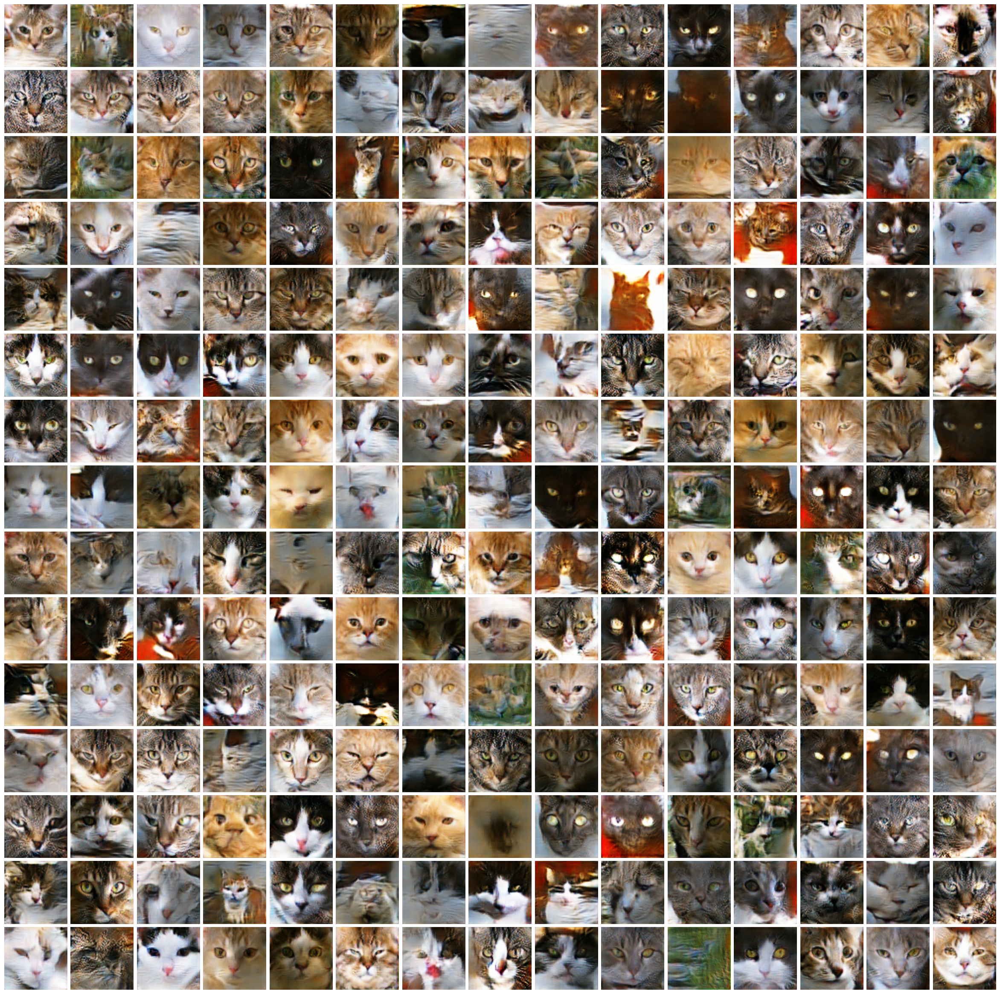

In [32]:
# Inference and visualization code
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable

# Hyperparameters (must match training settings)
latent_dim = 1024
img_size = 64
channels = 3

# Load generator
generator = Generator()
checkpoint = torch.load('model_big/checkpoint_epoch_200_20250121_200249.pth', map_location='cpu')
generator.load_state_dict(checkpoint['generator_state_dict'])
generator.eval()  # Set to evaluation mode

# Generate images
n_images = 15 * 15  # 225 images for 15x15 grid
noise = Variable(torch.FloatTensor(np.random.normal(0, 1, (n_images, latent_dim))))

with torch.no_grad():
    generated_images = generator(noise)

# Denormalize images from [-1, 1] to [0, 1]
generated_images = generated_images * 0.5 + 0.5

# Create plot
fig, axes = plt.subplots(15, 15, figsize=(30, 30))
for i, ax in enumerate(axes.flat):
    img = generated_images[i].permute(1, 2, 0).numpy()  # Convert to HWC format
    ax.imshow(img)
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()